# Top feature (30 features)

- We check the top 30 most important features for each subgroup (`RandomForest`):
   - Subgroup 1
   - Subgroup 2
   - Subgroup 3


In [1]:
# %% 1 importing libraries

import sys
import os
import ast # convert string model_params to dictionary
from click import command
import numpy as np
# import wget
import pandas as pd # to use dataframe
import glob
import shelve
import pickle
import copy
# import psutil

from pprint import pprint  # To print in a pretty way
# import missingno as msno
import nest_asyncio
nest_asyncio.apply()


import matplotlib.pyplot as plt # to make plots
import matplotlib as mpl
import seaborn as sns # to make plots
import scipy # to calculate correlation

import optuna
from optuna.distributions import IntDistribution
from optuna.distributions import FloatDistribution

from sklearn.metrics import mean_absolute_error # to calculate MAE
from sklearn.metrics import mean_squared_error  # to calculate MSE
from sklearn import linear_model
from sklearn.model_selection import KFold
from sklearn.exceptions import NotFittedError

# from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold
from julearn.inspect import preprocess
from julearn import run_cross_validation
from julearn.utils import configure_logging
from julearn.pipeline import PipelineCreator
from julearn.model_selection import RepeatedContinuousStratifiedKFold
# from julearn.model_selection import ContinuousStratifiedKFold


import tqdm
tqdm.tqdm
import shap

In [2]:
# %% 2 Color print in terminal 
RED   = "\033[1;31m"
BLUE  = "\033[1;34m"
CYAN  = "\033[1;36m"
GREEN = "\033[0;32m"
RESET = "\033[0;0m"
BOLD    = "\033[;1m"
REVERSE = "\033[;7m"
UNDERLINE = '\033[4m'
CBLACKBG  = '\33[40m'
CREDBG    = '\33[41m'
CGREENBG  = '\33[42m'
CYELLOWBG = '\33[43m'
CBLUEBG   = '\33[44m'
CVIOLETBG = '\33[45m'
CBEIGEBG  = '\33[46m'
CWHITEBG  = '\33[47m'

In [3]:
# %% 3 Starting statement
sys.stdout.write(RED)
# sys.stdout.write(BOLD)
print(
      "\n\n================================================="
      "\nprogram started\n"
      "=================================================\n\n"
      )
sys.stdout.write(CYAN)
print('Julearn info\n')
sys.stdout.write(RESET)
# To log information
configure_logging(level='INFO')



program started


Julearn info

2025-04-08 03:41:33,907 - julearn - INFO - ===== Lib Versions =====
2025-04-08 03:41:33,907 - julearn - INFO - numpy: 1.26.4
2025-04-08 03:41:33,908 - julearn - INFO - scipy: 1.13.1
2025-04-08 03:41:33,908 - julearn - INFO - sklearn: 1.4.2
2025-04-08 03:41:33,908 - julearn - INFO - pandas: 2.2.2
2025-04-08 03:41:33,908 - julearn - INFO - julearn: 0.3.3
2025-04-08 03:41:33,909 - julearn - INFO - ========================


In [4]:
print(sys.executable)

/home/mmahdipour/miniconda3/envs/BAG_optuna_SHAP/bin/python


In [6]:
#%% 4 Pathes
My_current_path=os.path.abspath(os.getcwd())

path_2_data_NEW = My_current_path + '/../../' + '1_DATA/4_BAG_Prediction/9_DATA_4_BAG_GMV_SHAP'
directory_ls=os.listdir(path_2_data_NEW)
sys.stdout.write(CYAN)
print(My_current_path)
sys.stdout.write(RESET)

sys.stdout.write(BLUE)
print(directory_ls)
sys.stdout.write(RESET)


/data/project/AgeGap_UKBB/UKBB_Age_prediction/2_src/0_for_Github
['listofcols2Cat.npy', 'MOSC_259_BAG_GMV_SHAP.csv', 'MOSC_201_BAG_GMV_SHAP.csv', 'MOSC_262_BAG_GMV_SHAP.csv', 'MOSC_261_BAG_GMV_SHAP.csv']


6

## Pathes
Here we should define pathes that we have saved `RandomForest` Results

In [7]:

Path_to_Predition_Results = My_current_path + '/../../' + '4_Results/12_BAG_optuna/'
Path_to_Predition_Results_SG1= Path_to_Predition_Results +'12_6_168_BAG_all_CR_RF'
Path_to_Predition_Results_SG2= Path_to_Predition_Results +'12_6_226_BAG_all_CR_RF'
Path_to_Predition_Results_SG3= Path_to_Predition_Results +'12_6_228_BAG_all_CR_RF'
Path_to_Predition_Results_SG4= Path_to_Predition_Results +'12_6_229_BAG_all_CR_RF'

In [8]:
New_Categories = pd.read_csv('/data/project/AgeGap_UKBB/UKBB_Age_prediction/3_scratch/13_optuna_Categories/Subgroup3/Sub3_UKBB_Cats/Sub3_UKBB_Cats_V2_forME.csv' ,index_col=0, sep=";").reset_index(drop=True)
print(New_Categories.columns)

palette = {
    
    'Body injuries and illnesses': '#ffbb78',  # Light 
    'Mental health and socio-affective factors': '#d62728',  # Muted Red
    'Body composition and body morphology': '#ff7f0e',  # Bright Orange
    'Diet and alcohol': '#2ca02c',  # Muted Green
    'Cardiovascular health': '#1f77b4',  # Muted Blue
    'Not a feature': 'gray',  # Gray
    'Eye/Vision impairment': '#aec7e8',  # Light Blue
    'Diabetes': '#98df8a',  # Light Green
    'Early life factors': '#9467bd',  # Medium Purple
    'Lifestyle and environment': '#8c564b',  # Copper
    'Sociodemographics': 'e377c2', # Light Pink  
    'Bone health': '#FFDF00',  # Golden Yellow
    'Baseline characteristics': '#7f7f7f',  # Dark Gray
    'Rest': 'gray',  # Gray 
    
    # 'Education': '#e377c2',  # Light Pink
    # 'Ethnicity': '#bcbd22'  # Olive
}
print(New_Categories['New_Category_for_plot'].value_counts())

Index(['Raw_Features', 'X_List', 'field_id', 'suffix', 'title',
       'New_Title_for_plot', 'New_Category_for_plot', 'title_category',
       'main_category', 'category_id', 'encoding_id', 'notes'],
      dtype='object')
New_Category_for_plot
Body injuries and illnesses                  69
Mental health and socio-affective factors    66
Body composition and body morphology         41
Diet and alcohol                             30
Cardiovascular health                        22
Not a feature                                13
Eye/Vision impairment                        11
Diabetes                                      5
Early life factors                            5
Lifestyle and environment                     5
Sociodemographics                             4
Bone health                                   2
Baseline characteristics                      1
Name: count, dtype: int64


## top 30 most important features




### Subgroup 3

In [8]:
# Load the model
with open(Path_to_Predition_Results_SG3+'/Model.pkl', 'rb') as file:
    model3 = pickle.load(file)

# # Load the inspector
with open(Path_to_Predition_Results_SG3 + '/inspector.pkl', 'rb') as file:
    inspector3 = pickle.load(file)

# # Load the scores
with open(Path_to_Predition_Results_SG3 +'/scores.pkl', 'rb') as file:
    scores3 = pickle.load(file)

In [9]:
Data2Model3 = inspector3._X.copy()
Data2Model3.columns = Data2Model3.columns.str.replace(
                                                        "__:type:__continuous", ""
                                                    ).str.replace(
                                                    "__:type:__categorical", ""
                                                    ).str.replace(
                                                    "__:type:__confounds", ""
                                                    )
X_list3 = list(Data2Model3.columns)
Data2Model3.head()
X_list3

['Age_asthma_diagnosed-2.0',
 'Forced_vital_capacity_FVC-0.0',
 'Duration_Age_stroke_diagnosed-2.0',
 'Falls_in_the_last_year-0.0',
 'Felt_hated_by_family_member_as_a_child-0.0',
 '26202-0.0',
 'Comparative_body_size_at_age_10-0.0',
 'Ever_contemplated_self-harm-0.0',
 'Sexually_molested_as_a_child-0.0',
 'Ever_self-harmed-0.0',
 'Maternal_smoking_around_birth-0.0',
 'Recent_worrying_too_much_about_different_things-0.0',
 'Ever_worried_more_than_most_people_would_in_similar_situation-0.0',
 'Age_COPD_Chronic_Obstructive_Pulmonary_Disease_diagnosed_by_doctor-0.0',
 'Bread_type-0.0',
 'Age_when_loss_of_vision_due_to_injury_or_trauma_diagnosed-2.0',
 'Duration_Interpolated_Age_of_participant_when_non-cancer_illness_first_diagnosed-2.1',
 'Forced_expiratory_volume_in_1-second_FEV1-0.0',
 'Age_tuberculosis_diagnosed_by_doctor-0.0',
 'Friendships_satisfaction-2.0',
 'Number_of_self-reported_cancers-0.0',
 'Recent_easy_annoyance_or_irritability-0.0',
 'Body_mass_index_BMI-0.0',
 'Arm_fat_mass

In [10]:
with open(My_current_path + '/../../13_visualization_Tasks_Sep2024/Top_features' + '/explainers_pickle/explainer3.pkl', 'rb') as file:
    explainer3 = pickle.load(file)

# # Load the expl3
with open(My_current_path + '/../../13_visualization_Tasks_Sep2024/Top_features' + '/explainers_pickle/expl3.pkl', 'rb') as file:
    expl3 = pickle.load(file)

# # Load the shap_values3
with open(My_current_path + '/../../13_visualization_Tasks_Sep2024/Top_features' + '/explainers_pickle/shap_values3.pkl', 'rb') as file:
    shap_values3 = pickle.load(file)

Preprocessed_features3=preprocess(model3.best_estimator_, X=X_list3, data=Data2Model3, until="confound_removal")
print(Preprocessed_features3.shape)
print(Data2Model3.shape)

(3706, 261)
(3706, 266)


In [11]:
# # %% to calculate preprocessed data
# '''
# X_list # ==>  features (continuous & categorical) & confounds
# Data2Model # 
# '''
# Preprocessed_features3=preprocess(model3.best_estimator_, X=X_list3, data=Data2Model3, until="confound_removal")
# print(Preprocessed_features3.shape)
# print(Data2Model3.shape)
# '''
# models:
# inspector._model.best_estimator_[-1].model
# model.best_estimator_[-1].model

# scores.estimator[i_max].best_estimator_[-1].model
# '''
# # # Create object that can calculate shap values
# # explainer1 = shap.TreeExplainer(model1.best_estimator_[-1].model, 
# #                                # feature_perturbation='tree_path_dependent',  
# #                                seed=100)
# # # Calculate Shap values
# # shap_values1 = explainer1.shap_values(Preprocessed_features1)

# explainer3 = shap.Explainer(model3.best_estimator_[-1].model, Preprocessed_features3,  seed=100)
# expl3 = explainer3(Preprocessed_features3)
# shap_values3 = explainer3.shap_values(Preprocessed_features3)

In [12]:
print(model3.best_estimator_[-1].model)
print(inspector3._model.best_estimator_[-1].model)
scores3

RandomForestRegressor(max_depth=162, min_samples_leaf=8, min_samples_split=9,
                      n_estimators=616)
RandomForestRegressor(max_depth=162, min_samples_leaf=8, min_samples_split=9,
                      n_estimators=616)


,fit_time,score_time,estimator,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2,test_r2_corr,train_r2_corr,test_r_corr,train_r_corr,n_train,n_test,repeat,fold,cv_mdsum
0,0.015887,0.000000,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2964,742,0,0,e77c487a313fbde10f9a0a333883c6cb
1,21740.472613,0.129944,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.460424,-3.354864,-31.530811,-18.782904,-5.615230,-4.333925,0.066731,0.447648,0.067822,0.728491,0.260426,0.853517,2965,741,0,1,e77c487a313fbde10f9a0a333883c6cb
2,0.015894,0.000000,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2965,741,0,2,e77c487a313fbde10f9a0a333883c6cb
3,49570.760597,0.103644,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.485107,-3.233612,-32.971654,-17.287599,-5.742095,-4.157836,0.043424,0.488944,0.044775,0.758413,0.211602,0.870869,2965,741,0,3,e77c487a313fbde10f9a0a333883c6cb
4,20087.701641,0.127152,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.656674,-2.759010,-34.630566,-13.105210,-5.884774,-3.620112,0.053683,0.606463,0.053819,0.865263,0.231989,0.930195,2965,741,0,4,e77c487a313fbde10f9a0a333883c6cb
5,17653.183707,0.084177,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.432097,-2.917454,-31.204746,-14.501294,-5.586121,-3.808056,0.021927,0.579232,0.030920,0.828071,0.175841,0.909984,2964,742,1,0,e77c487a313fbde10f9a0a333883c6cb
6,20624.009503,0.089439,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.607405,-3.648374,-33.872120,-21.723742,-5.819976,-4.660873,0.056315,0.351094,0.056695,0.591746,0.238107,0.769250,2965,741,1,1,e77c487a313fbde10f9a0a333883c6cb
7,8172.184129,0.108877,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.354867,-3.245550,-30.154619,-17.646343,-5.491322,-4.200755,0.078676,0.484991,0.083428,0.774050,0.288840,0.879801,2965,741,1,2,e77c487a313fbde10f9a0a333883c6cb
8,18047.680348,0.105473,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.480926,-3.785424,-32.100497,-23.294565,-5.665730,-4.826444,0.045066,0.315828,0.045260,0.514393,0.212743,0.717212,2965,741,1,3,e77c487a313fbde10f9a0a333883c6cb
9,43005.547943,0.072870,"OptunaSearchCV(cv=KFold(n_splits=5, random_sta...",-4.570133,-3.389927,-34.024287,-18.811519,-5.833034,-4.337225,0.044097,0.439297,0.044614,0.687042,0.211221,0.828880,2965,741,1,4,e77c487a313fbde10f9a0a333883c6cb


   - Bar plot

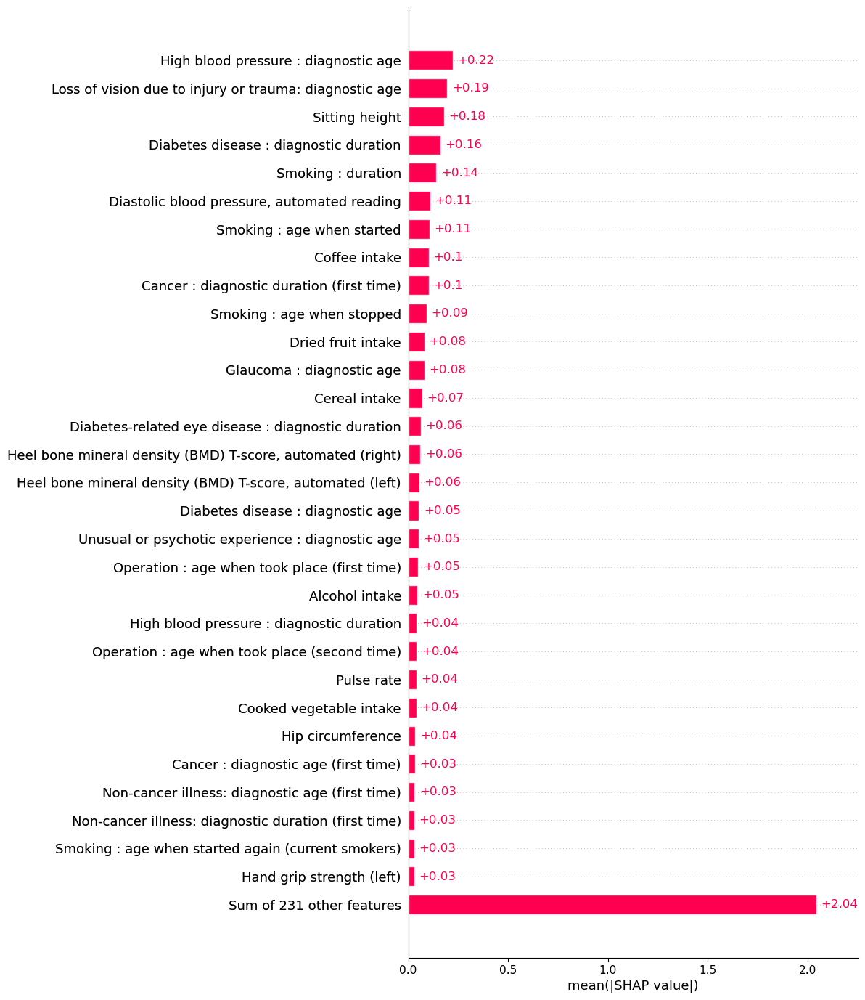

In [13]:
expl3_copy = copy.deepcopy(expl3)
# Create a mapping from old feature names to new titles
feature_mapping = dict(zip(New_Categories['X_List'], New_Categories['New_Title_for_plot']))
# Replace feature names in the filtered_expl3
expl3_copy.feature_names = [feature_mapping.get(f, f) for f in expl3_copy.feature_names]

shap.plots.bar(expl3_copy, max_display=31, show=True)

- Most important features

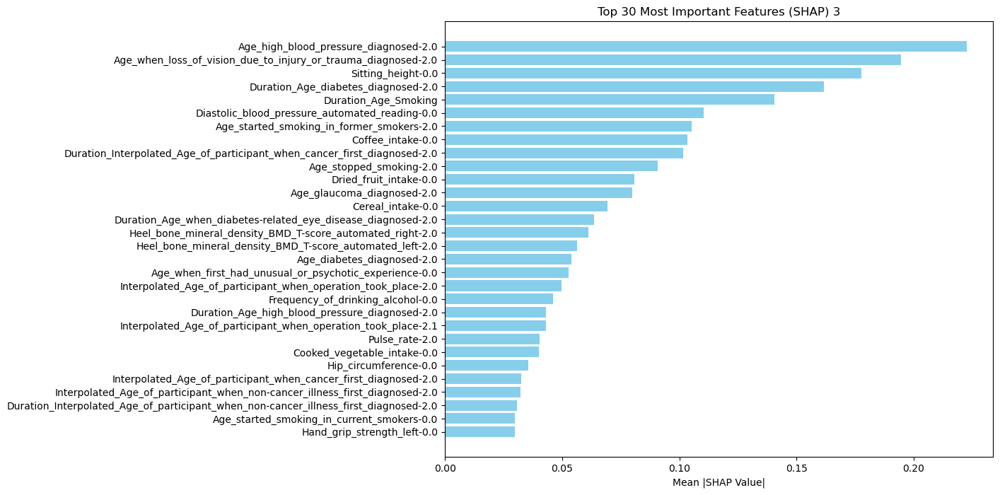

In [14]:
# Get feature names (assuming Preprocessed_features4 is a DataFrame)
feature_names3 = Preprocessed_features3.columns

# Extract SHAP values from the Explanation object
shap_values3

# Calculate mean absolute SHAP values for each feature across all samples
mean_abs_shap_values3 = np.mean(np.abs(shap_values3), axis=0)

# Create a DataFrame for easy sorting and visualization
shap_importance_df3 = pd.DataFrame({
    'feature': feature_names3,
    'mean_abs_shap_value': mean_abs_shap_values3
})

# Sort the features by their mean absolute SHAP value in descending order
shap_importance_df3 = shap_importance_df3.sort_values(by='mean_abs_shap_value', ascending=False)

# Get the top 30 most important features
top_30_features3 = shap_importance_df3.head(30)

# Display the result
# print(top_30_features1.iloc[:,1])

plt.figure(figsize=(10, 8))
plt.barh(top_30_features3['feature'], top_30_features3['mean_abs_shap_value'], color="skyblue")
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.xlabel("Mean |SHAP Value|")
plt.title("Top 30 Most Important Features (SHAP) 3")
plt.show()

In [15]:
# RF3_merged = pd.merge(shap_importance_df3, New_Categories, how = 'left',
#                            left_on ='feature', right_on= 'X_List')

# RF3_merged.loc[RF3_merged['feature'] == 'Duration_26202-0.0', ['feature', 'Raw_Features','X_List']] = 'Duration_Interpolated_Age_of_participant_when_operation_took_place-2.5'

# RF3_merged.loc[RF3_merged['feature'] == 'Duration_26204-0.0', ['feature', 'Raw_Features','X_List']] = 'Interpolated_Age_of_participant_when_operation_took_place-2.5'

# RF3_merged[['New_Title_for_plot', 'mean_abs_shap_value','field_id',
#        'suffix', 'feature', 'title', 'New_Category_for_plot',
#        'title_category', 'main_category', 'category_id', 'encoding_id']].to_csv('/data/project/AgeGap_UKBB/UKBB_Age_prediction/4_Results/excel_files/14_SHAP_files/Subgroup3_RF_SHAP.csv')


In [27]:
RF3_top30_merged = pd.merge(top_30_features3, New_Categories, how = 'left',
                           left_on ='feature', right_on= 'X_List')
# Plotting
plt.figure(figsize=(260, 200))
sns.barplot(
    data=RF3_top30_merged,
    y='New_Title_for_plot',
    x='mean_abs_shap_value',
    hue='New_Category_for_plot',
    palette=palette,
    dodge=False  # Set to False to avoid offsetting bars
)

# Adding titles and labels
# plt.title('Mean Absolute SHAP Value Vs Features color-coded by Category Subgroup 1, RandomForest', fontsize=220)
plt.xlabel('Mean Absolute SHAP Value', fontsize=300)
plt.ylabel('Features', fontsize=300)
# Increase tick label sizes for both x and y axes
plt.xticks(fontsize=280)
plt.yticks(fontsize=300)
plt.legend(title='Title Category',
           title_fontsize=300, 
           # bbox_to_anchor=(1.05, 1), 
           loc='lower right', fontsize=280)

# Display the plot with tight layout
plt.tight_layout()
# plt.show()
plt.savefig("SHAP_PLOTS/RF3_SHAP_BAR.png", bbox_inches="tight")
plt.savefig("SHAP_PLOTS/RF3_SHAP_BAR.svg", bbox_inches="tight")
plt.show()
plt.close()

- Beaswarm Plot

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


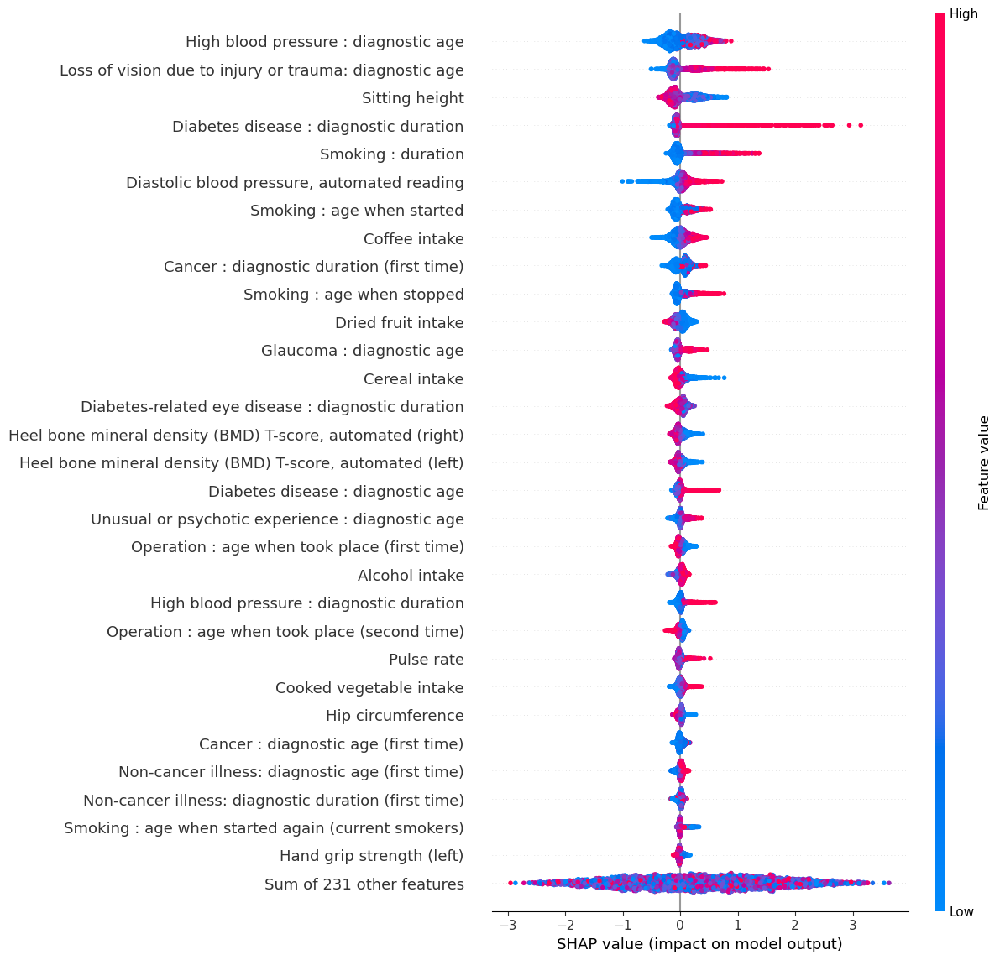

In [17]:
# using SHAP explainer
shap.plots.beeswarm(expl3_copy,
                    max_display=31)

#### waterfall plot

This plot is subject depended

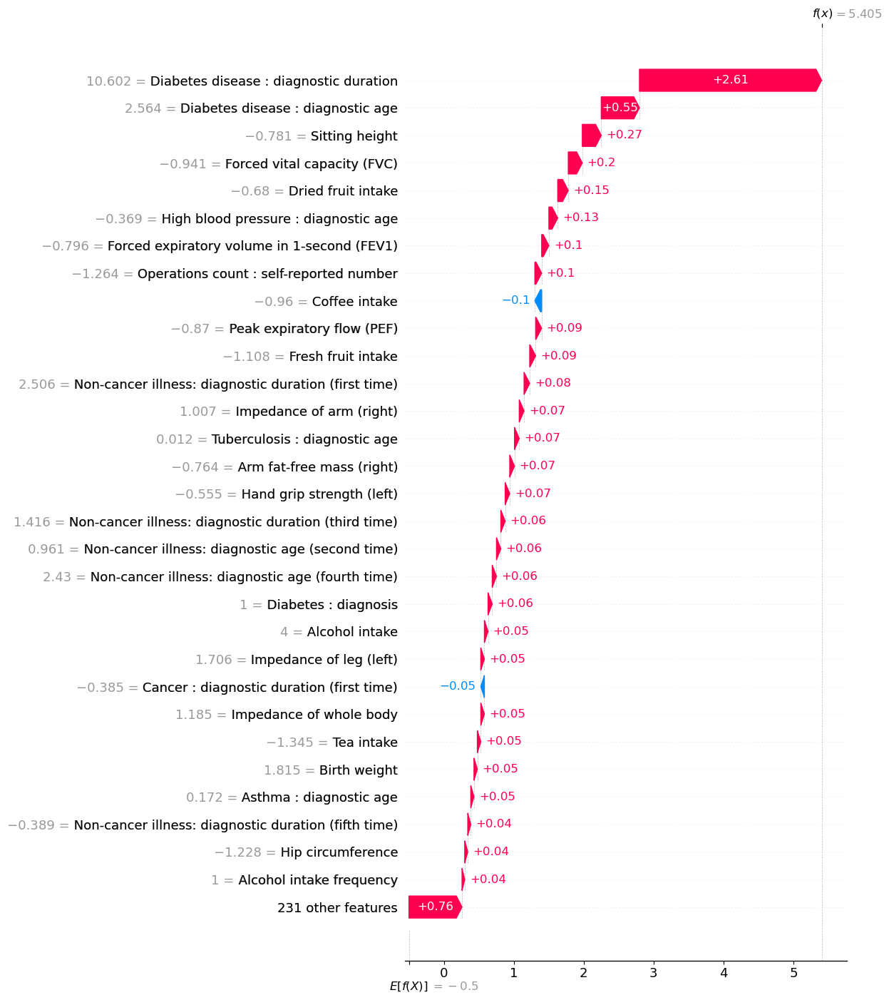

In [17]:
# subject number 0
shap.plots.waterfall(expl3_copy[0],max_display=31)

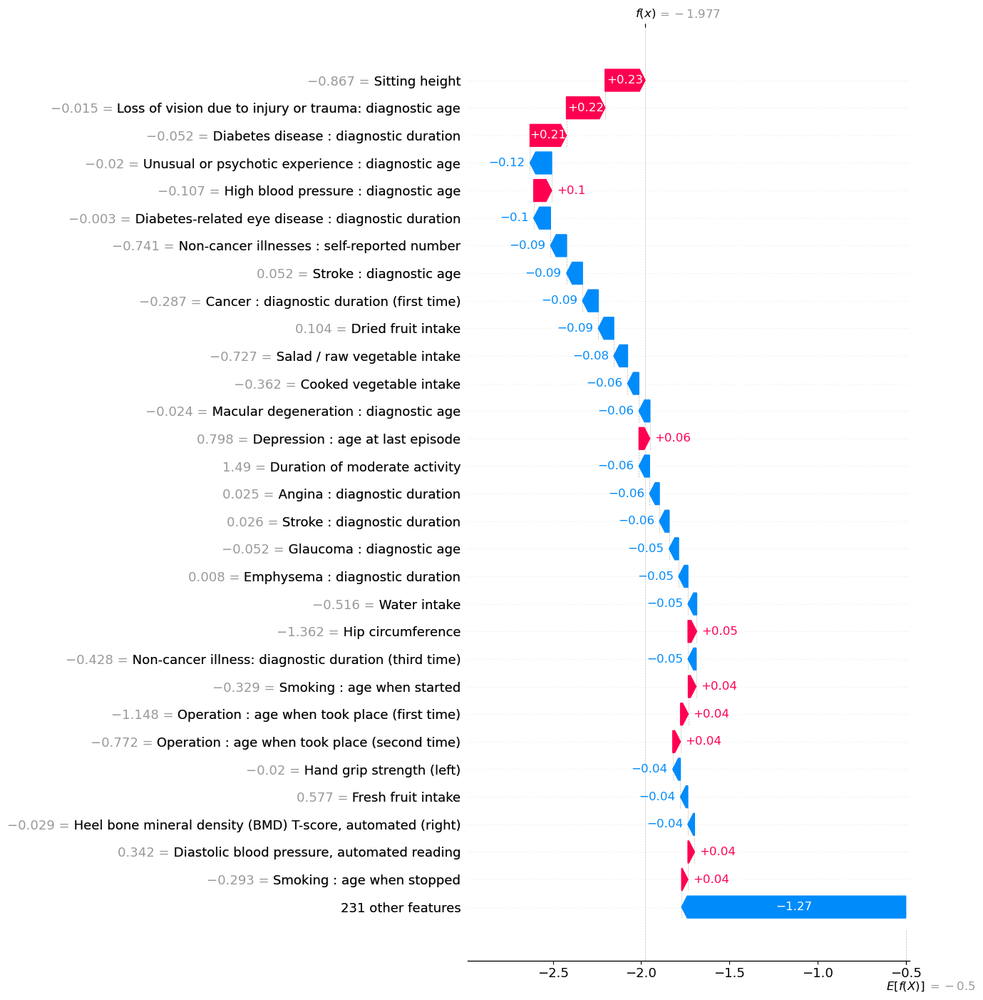

In [18]:
# subject number 1000
shap.plots.waterfall(expl3_copy[1000],max_display=31)